In [1]:
import pandas as pd
import numpy as np

In [2]:
data = pd.read_csv('Water_FINAL.csv')

C:\Users\isaac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3063: DtypeWarning: Columns (2,3,4,5,6,9,11,13,15,17,21,22,23,24,27,28,31,32,33,34,35,36,37,40,41,42,43,44,45,46,47,48,49,50,55,56,57,58,59,60,61,62,63,64,65,66) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [14]:
data['Stream Flow'].unique()

array([nan, 'Normal', 'Dry (Negligible)', 'High', 'Low', 'high', 'normal',
       'low', 'Negligible'], dtype=object)

In [28]:
benthic = pd.read_excel('CMC_Benthic_Data.xlsx')

In [31]:
benthic.columns

Index(['EVENT_ID', 'SAMPLE_NUMBER', 'STATION_ID', 'ICPRB_BIOREGION_ID',
       'STRAHLER_STREAM_ORDER', 'G_Method', 'SAMPLE_DATE', 'MONTH', 'Latitude',
       'Longitude', 'FINAL_ID', 'REPORTING_VALUE', 'TSN_FINAL', 'TAXON_LEVEL',
       'PHYLUM', 'SUBPHYLUM', 'CLASS', 'SUBCLASS', 'ORDER', 'SUBORDER',
       'FAMILY', 'SUBFAMILY', 'TRIBE', 'GENUS', 'SPECIES', 'ASPT', 'BIBI_TV',
       'BIBI_FFG', 'BIBI_HABIT'],
      dtype='object')

In [38]:
benthic['PHYLUM'].unique()

array(['PLATYHELMINTHES', 'ANNELIDA', 'MOLLUSCA', 'ARTHROPODA',
       'UNIDENTIFIED', 'INSECTA', 'MALACOSTRACA', 'GASTROPODA', 0,
       'BIVALVIA', 'OLIGOCHAETA', 'ENTOGNATHA', nan, 'TREPAXONEMATA',
       'HIRUDINEA', 'HYDROZOA', 'ENOPLA'], dtype=object)

## Reading HUC12 Data

In [2]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point, Polygon, LineString
import fiona
from datetime import datetime
#import geoplot as gplt
#import geoplot.crs as gcrs

In [17]:
layers = fiona.listlayers('wbdhu12_a_us_september2019.gdb')
# Read into a geodataframe
huc12 = gpd.read_file('wbdhu12_a_us_september2019.gdb', layer = 'WBDHU12')

In [18]:
# Convert to lat long
huc12.crs = {'init': 'epsg:2283'}

In [90]:
# Filter for the rows that contain the CB states
bay_states = ['MD', 'PA']
keep = []
for i in bay_states:
    for x in huc12['STATES'].unique():
        if i in x:
            keep.append(x)
        else:
            pass
keephuc = huc12[huc12['STATES'].isin(keep)]

### Read in County Boundaries

In [5]:
counties = gpd.read_file('tl_2017_us_county.shp')

In [6]:
fips = pd.read_csv('us-state-ansi-fips.csv')

In [7]:
# get the state for each county from the FIPs codes
fips['fips'] = ['0' + str(i) if len(str(i)) == 1 else str(i) for i in fips[' st']]
fipsdict = dict(zip(fips['fips'], fips[' stusps'].map(lambda x: x[1:])))
counties['state'] = counties['STATEFP'].map(fipsdict)
counties['fullfips'] = counties['STATEFP'] + counties['COUNTYFP']

keep_counties = counties[counties['state'].isin(bay_states)]

### Read in Water and Benthic Data

In [8]:
water = pd.read_csv('Water_FINAL.csv')
benthic = pd.read_csv('CBP_Benthic.csv')

C:\Users\isaac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (2,3,4,5,6,9,11,13,15,17,21,22,23,24,27,28,31,32,33,34,35,36,37,40,41,42,43,44,45,46,47,48,49,50,55,56,57,58,59,60,61,62,63,64,65,66) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [9]:
# Getting the geospatial points
water['Point'] = [Point(x, y) for x, y in zip(water['Longitude'], water['Latitude'])]
benthic['Point'] = [Point(x, y) for x, y in zip(benthic['Longitude'], benthic['Latitude'])]

In [10]:
# Get unique points
water_collections = water[['Longitude', 'Latitude']].drop_duplicates()
benthic_collections = benthic[['Longitude', 'Latitude']].drop_duplicates()

allpoints = pd.concat([water_collections, benthic_collections], axis = 0, sort = True)
allpoints.drop_duplicates(inplace = True)
allpoints['Point'] = [Point(x, y) for x, y in zip(allpoints['Longitude'], allpoints['Latitude'])]

In [11]:
# Getting the HUC12 codes for the data

hucs = []
names = []

for i in allpoints['Point']:
    huc = ""
    name = ""
    for x, y, z in zip(keephuc['NAME'], keephuc['HUC12'], keephuc['geometry']):
        if z.contains(i) == True:
            name = x
            huc = y
            break
        else:
            pass
    
    hucs.append(huc)
    names.append(name)

In [12]:
allpoints['HUC12'] = hucs
allpoints['HUCNAME'] = names

In [13]:
# Get the FIPS codes for each point
fips = []
states = []
counties = []
for i in allpoints['Point']:
    
    fip = ""
    state = ""
    county = ""
    for w, x, y, z in zip(keep_counties['fullfips'], keep_counties['state'], keep_counties['NAMELSAD'], keep_counties['geometry']):
            
        if z.contains(i) == True:
            fip = w
            state = x
            county = y
            break
        else:
            pass
            
    fips.append(fip)
    states.append(state)
    counties.append(county)
    
allpoints['FIPS'] = fips
allpoints['STATE'] = states
allpoints['COUNTY'] = counties

In [14]:
allpoints = allpoints.dropna()

In [82]:
allpoints.loc[allpoints['HUC12'] == '020600060202', :]

,Latitude,Longitude,Point,HUC12,HUCNAME,FIPS,STATE,COUNTY
1492798,39.16775,-76.85125,POINT (-76.85124999999999 39.16775),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
4936,39.12900,-76.82860,POINT (-76.82859999999999 39.129),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
5486,39.23770,-76.80790,POINT (-76.8079 39.2377),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
5493,39.15690,-76.91330,POINT (-76.91330000000001 39.1569),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
5500,39.14780,-76.88360,POINT (-76.8836 39.1478),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
...,...,...,...,...,...,...,...,...
107837,39.20115,-76.87915,POINT (-76.87915 39.20115),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
107845,39.20857,-76.86419,POINT (-76.86419000000002 39.20857),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
110993,39.24070,-76.85011,POINT (-76.85011 39.2407),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County
112946,39.21833,-76.81882,POINT (-76.81882 39.21833),020600060202,Dorsey Run-Little Patuxent River,24027,MD,Howard County


In [45]:
allpoints.groupby('HUC12')['STATE'].value_counts().sort_values(ascending = False)

HUC12         STATE
020600060202  MD       129
020600031201  MD        80
020600031102  MD        61
020700080802  MD        59
020600040203  MD        59
                      ... 
020700100603  VA         1
020700100601  VA         1
020700100503  VA         1
020700100307  DC         1
020403030303  MD         1
Name: STATE, Length: 1610, dtype: int64

### Wrangling the Water Data to make sense more

https://www.chesapeakemonitoringcoop.org/wp-content/uploads/2020/07/Data-Dictionary_June-2020.pdf

In [89]:
water['HUC12_'].value_counts()

20600010000    376906
20801010000    286757
20700111001     53982
20801070204     42291
20600040302     35934
                ...  
20502050101         4
20501020702         4
20501020801         4
20502050505         4
20501050203         2
Name: HUC12_, Length: 759, dtype: int64

In [91]:
water.groupby('HUC12_')['coordinates'].nunique().sort_values(ascending = False)

HUC12_
20600040203    59
20600010000    52
20700100204    40
20600040302    31
20802050607    26
               ..
20503050502     1
20503050503     1
20700110904     1
20503050802     1
20403030303     1
Name: coordinates, Length: 759, dtype: int64

In [107]:
water_subset = water[water['HUC12_'] == 20600010000]

In [94]:
water_subset.to_csv('water_subset.csv')

In [109]:
# Change the date
water_subset['Date'] = water_subset['Date'].apply(lambda x: datetime.strptime(x, '%m/%d/%Y'))

C:\Users\isaac\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Plotting Using Mapbox and plotly

In [3]:
import plotly.graph_objects as go
mapbox_access_token = "pk.eyJ1IjoidGhhbXN1cHBwIiwiYSI6ImNrN3Z4eTk2cTA3M2czbG5udDBtM29ubGIifQ.3UvulsJUb0FSLnAOkJiRiA"

There are 2544 unique coordinates, but only 912 unique stations (some coordinates are not stations?)
1622 unique StationCodes and StationNames - but they are 

In [18]:
water.groupby('coordinates')['Point'].count().sort_values(ascending = False)

coordinates
(-76.29215, 38.3187)     28318
(-76.39945, 38.82593)    28240
(-76.22787, 38.13705)    27817
(-76.34565, 38.41457)    27767
(-76.35967, 38.99596)    26170
                         ...  
(-76.0045, 42.1804)          2
(-77.1025, 40.2597)          1
(-79.25378, 38.20305)        1
(-79.29465, 38.27945)        1
(-77.6392, 41.83788)         1
Name: Point, Length: 2544, dtype: int64

In [161]:
water_subset['Year'] = water_subset['Date'].apply(lambda x: x.year)
water_subset['Month'] = water_subset['Date'].apply(lambda x: x.month)
water_subset['Day'] = water_subset['Date'].apply(lambda x: x.day)


C:\Users\isaac\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\isaac\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\isaac\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

In [135]:
water_site_counts = water_subset.groupby('coordinates')['Point'].agg(['count', 'first'])
water_site_counts['Lat'] = water_site_counts['first'].apply(lambda x: x.y)
water_site_counts['Long'] = water_site_counts['first'].apply(lambda x: x.x)

In [77]:
# Initial Mapbox plot of all the points with data points

fig = go.Figure(go.Scattermapbox(
        lat = water_site_counts['Lat'],
        lon = water_site_counts['Long'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size = 5,
            color = water_site_counts['count']
        ),
        text= water_site_counts['count'],
    ))

fig.update_layout(
    height = 800,
    width = 1000,
    margin = {'l': 50, 'r': 50, 't': 0, 'b': 0},
    hovermode='closest',
    showlegend = True,
    name = 'Test',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=go.layout.mapbox.Center(
            lat=40,
            lon=-75
        ),
        pitch=0,
        zoom=7
    )
)

fig.show()

NameError: name 'water_site_counts' is not defined

### Testing for the Interactive Visualization

In [3]:
water = pd.read_csv('water_FINAL.csv')

C:\Users\isaac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (3,4,5,6,7,10,12,14,16,18,22,23,24,25,28,29,32,33,34,35,36,37,38,41,42,43,44,45,46,47,48,49,50,51,56,57,58,59,60,61,62,63,64,65,66,67) have mixed types.Specify dtype option on import or set low_memory=False.



In [68]:
water['Latitude'].apply(lambda x: round(x, 3))

0          39.480
1          39.480
2          39.467
3          39.454
4          39.464
            ...  
2708712    36.905
2708713    36.905
2708714    36.905
2708715    36.905
2708716    36.905
Name: Latitude, Length: 2708717, dtype: float64

In [86]:
water_subset = water.loc[water['HUC12_'] == 20600010000, :]

In [87]:
water_subset = water_subset[['Date', 'Year', 'Month', 'Day', 'Time', 'Longitude', 'Latitude', 'coordinates', 'Parameter',
                            'ParameterName_CBP', 'ParameterName_CMC', 'Source', 'Station', 'StationCode', 'StationName',
                            'MeasureValue', 'HUC12_', 'HUCNAME_', 'COUNTY_', 'STATE_']]

In [89]:
longitude = -76.17579
latitude = 39.34873

In [90]:
# Subset by measure value
measure = water_subset.loc[(water_subset['Longitude'] == longitude) & (water_subset['Latitude'] == latitude) &
                           (water_subset['Parameter'] == 'TN'), ['Date', 'Time', 'MeasureValue']]
# Change to datetime object
measure['Date'] = measure['Date'].apply(lambda x: datetime.strptime(x, '%Y-%m-%d'))

In [91]:
# Arrange in ascending date order
measure = measure.sort_values('Date', ascending = True)
measure['hoverinfo'] = measure.apply(lambda row: '{}, {}'.format(datetime.strftime(row['Date'], '%Y-%m-%d'), row['Time']), axis = 1)

In [93]:
# Plotly time series plot
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x = measure['Date'],
        y = measure['MeasureValue'],
        name = 'Test',
        mode = 'lines',
        text = measure['hoverinfo'],
        hoverinfo = 'text+y'
    ))

fig.update_layout(
    title = 'Total Nitrogen',
    yaxis_title = 'Total Nitrogen',
    xaxis_title = 'Date'
)

fig.show()

## Auto-ARIMA

In [120]:
import fbprophet

ModuleNotFoundError: No module named 'fbprophet'

In [98]:
series = measure.groupby(['Date'])['MeasureValue'].mean().reset_index()

In [111]:
series = measure.set_index('Date')
series = series.resample('M').mean()

In [117]:
auto_arima(series, start_p = 0, start_d = 1, start_q = 0,
          max_p = 3, max_d = 3, max_q = 3, 
          start_P = 0, start_D = 1, start_Q = 0,
          max_P = 3, max_D = 3, max_Q = 3,
          m = 12, seasonal = True, random_state = 10, n_fits = 20)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

## Looking at Point Source Data

In [74]:
water_subset = pd.read_csv('water_subset.csv')

C:\Users\isaac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (6,10,14,16,23,28,32,35,38,43,46,47,49,63,67) have mixed types.Specify dtype option on import or set low_memory=False.



In [76]:
water_subset['coordinates'].unique()

array(['(-76.06811, 39.38261)', '(-76.473597, 38.895678000000004)',
       '(-76.40131, 38.64498)', '(-76.37574000000002, 38.32522)',
       '(-76.42151, 38.312)', '(-76.30631, 39.16369)',
       '(-76.42794, 38.55505)', '(-76.49401999999998, 38.55728)',
       '(-76.50216999999998, 38.64354)', '(-76.34565, 38.41457)',
       '(-76.39945, 38.82593)', '(-76.17579, 39.348729999999996)',
       '(-76.02599000000002, 39.44149)', '(-76.46271999999998, 38.81498)',
       '(-76.34517, 39.00412)', '(-76.2405, 39.2495)',
       '(-76.42126999999998, 38.64618)', '(-76.37144, 38.81809000000001)',
       '(-76.35967, 38.99596)', '(-76.29215, 38.3187)',
       '(-76.3881, 39.00462)', '(-76.22787, 38.13705)',
       '(-76.39121, 38.55624)', '(-76.35438, 39.00585)',
       '(-76.0333, 39.4167)', '(-76.0525, 39.4475)',
       '(-76.0006, 39.4866)', '(-76.34747, 39.17573)',
       '(-76.29321999999998, 39.2037)', '(-76.30731999999998, 39.09698)',
       '(-76.35996999999998, 39.04072)', '(-76.0414, 39.

In [32]:
water_subset[['Parameter', 'ParameterName_CBP', 'ParameterName_CMC', 'MeasureValue', 'Unit']]

,Parameter,ParameterName_CBP,ParameterName_CMC,MeasureValue,Unit
0,SA.9,SALINITY UNITS IN PPT AND EQUAL TO PRACTICAL S...,Salinity,0.2,pps
1,SA.9,SALINITY UNITS IN PPT AND EQUAL TO PRACTICAL S...,Salinity,0.1,pps
2,SA.9,SALINITY UNITS IN PPT AND EQUAL TO PRACTICAL S...,Salinity,0.1,pps
3,SA.9,SALINITY UNITS IN PPT AND EQUAL TO PRACTICAL S...,Salinity,0.1,pps
4,SA.9,SALINITY UNITS IN PPT AND EQUAL TO PRACTICAL S...,Salinity,0.1,pps
...,...,...,...,...,...
376901,WTEMP,WATER TEMPERATURE DEG,NaN,28.7,DEG C
376902,WTEMP,WATER TEMPERATURE DEG,NaN,27.5,DEG C
376903,WTEMP,WATER TEMPERATURE DEG,NaN,28.6,DEG C
376904,WTEMP,WATER TEMPERATURE DEG,NaN,27.3,DEG C


In [19]:
water.loc[(water['HUC12_'] == 20600010000) & (water['Latitude'] >= 39.44) & (water['Latitude'] <= 39.45), :].reset_index(drop = True).iloc[0, :]['StationCode']

nan

In [4]:
psdata = pd.read_csv('PointSourceFacilityInformationState.csv')

In [48]:
psdata.loc[psdata['Facility'] == 'BETTERTON', :].iloc[:, 10:20]

,FacilitySize,Status,ActiveDate,InactiveDate,DesignFlow,PermitFlow,WSMSeg,HUC8,CatalogingUnitDescription,HUC11
123,MINOR,ACTIVE,NaN,NaN,0.2,0.15,810.0,2060002.0,CHESTER-SASSAFRAS,310.0


In [42]:
psdata2 = pd.read_csv('PointSourceLoadDataState.csv')

C:\Users\isaac\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning:

Columns (2) have mixed types.Specify dtype option on import or set low_memory=False.



In [43]:
psdata2['LATITUDE'] = psdata2['LATITUDE'].apply(lambda x: round(x, 5))
psdata2['LONGITUDE'] = psdata2['LONGITUDE'].apply(lambda x: round(x, 5))

In [44]:
psdata2['coordinates'] = psdata2.apply(lambda row: (row['LATITUDE'], row['LONGITUDE']), axis = 1)
psdata2 = psdata2.drop_duplicates('coordinates').reset_index(drop = True)
psdata2 = psdata2.dropna(subset = ['LATITUDE'])

psdata2['geometry'] = psdata2.apply(lambda row: shapely.geometry.Point(row['LATITUDE'], row['LONGITUDE']), axis = 1)

## Auto-Arima Time Series Modelling in Python

In [77]:
point = water_subset.loc[(water_subset['coordinates'] == '(-76.29215, 38.3187)') & (water_subset['Parameter'] == 'TN'), :]

In [85]:
point[['Date', 'Time', 'MeasureValue']]

,Date,Time,MeasureValue
4971,2006-05-08,13:36:00,0.706
4972,2006-05-08,13:36:00,0.710
4973,2006-05-08,13:36:00,0.525
4974,2006-05-08,13:36:00,0.560
5361,2005-08-08,12:28:00,0.482
...,...,...,...
353442,2018-07-09,12:50:00,0.523
368400,2019-12-13,13:28:00,0.485
368401,2019-12-13,13:28:00,0.522
368402,2019-12-13,13:28:00,0.430


In [64]:
point['Parameter'].unique()

array(['SA.9', 'DO.5', 'AT.3', 'WT.4'], dtype=object)

## Watershed Data

In [5]:
import shapely
import json

In [6]:
rivers = gpd.read_file('P6Beta_v3_LRSegs_081516/P6Beta_v3_LRSegs_081516.shp')

In [7]:
rivers = rivers.to_crs(epsg = 4326)

In [8]:
# Generate centroids

rivers['centroid'] = rivers['geometry'].apply(lambda row: row.centroid)
rivers['LON'] = rivers['centroid'].apply(lambda row: row.x)
rivers['LAT'] = rivers['centroid'].apply(lambda row: row.y)

In [9]:
rivers = rivers.loc[rivers['Region'] == 'Chesapeake Bay Watershed', :]

In [10]:
rivers_condensed = rivers.loc[rivers['Watershed'] == 'Susquehanna River Basin', :].reset_index(drop = True)
rivers_condensed['geometry'] = rivers_condensed['geometry'].apply(lambda x: json.dumps(shapely.geometry.mapping(x)))

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:852: UserWarning:

Geometry column does not contain geometry.



In [11]:
rivers_condensed[['CBSEG_92', 'PRECIP', 'RiverSimu', 'TidalWater', 'MEANPRECIP', 'CBW']]

,CBSEG_92,PRECIP,RiverSimu,TidalWater,MEANPRECIP,CBW
0,CB1TF,N,Simulated River,N,1029,Y
1,CB1TF,N,Simulated River,N,1066,Y
2,CB1TF,N,Simulated River,N,1106,Y
3,CB1TF,N,Simulated River,N,1106,Y
4,CB1TF,N,Simulated River,N,1134,Y
...,...,...,...,...,...,...
612,CB1TF,N,Simulated River,N,1182,Y
613,CB1TF,L,Simulated River,N,997,Y
614,CB1TF,N,Simulated River,N,1171,Y
615,CB1TF,L,Simulated River,N,1016,Y


In [12]:
# 92-segment data
segments = gpd.read_file('Chesapeake_Bay_92_Segments-shp/Chesapeake_Bay_92_Segments.shp')
segments['centroid'] = segments['geometry'].apply(lambda row: row.centroid)
segments['LON'] = segments['centroid'].apply(lambda row: row.x)
segments['LAT'] = segments['centroid'].apply(lambda row: row.y)
segments['geometry'] = segments['geometry'].apply(lambda x: json.dumps(shapely.geometry.mapping(x)))

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:852: UserWarning:

Geometry column does not contain geometry.



In [93]:
keephuc = keephuc.reset_index(drop = True)

In [91]:
test_point = psdata2['geometry'][0]

In [94]:
for i in range(len(keephuc)):
    huc_geom = keephuc['geometry'][i]

    if point.within(huc_geom):
        print('Found!')
        huc = keephuc['HUC12'][i]
        print(huc)

In [66]:
# For every point source, find out the HUC12 it is in

points = list(psdata2['coordinates'])

In [71]:
points = list(psdata2['geometry'])

In [72]:
def find_huc(point):
    #point = shapely.geometry.Point(coord[0], coord[1])
    for i in range(len(keephuc)):
        huc_geom = keephuc['geometry'][i]

        if point.within(huc_geom):
            print('Found!')
            huc = keephuc['HUC12'][i]
            print(huc)
            return huc
    print('None found')
    return 'None'

In [73]:
points_huc_dict = {}
for point in points:
    find_huc(point)
    
    #points_huc_dict.update({point: find_huc(point)})

None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found
None found

KeyboardInterrupt: 

In [20]:
keephuc['centroid'] = keephuc['geometry'].apply(lambda row: row.centroid)
keephuc['LON'] = keephuc['centroid'].apply(lambda row: row.x)
keephuc['LAT'] = keephuc['centroid'].apply(lambda row: row.y)

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pa

In [ ]:
### Checking which HUC the point sources are in

In [21]:
psdata.columns

Index(['Facility', 'WaterShed', 'WaterShed', 'CountyCity', 'Latitude',
       'Longitude', 'Point'],
      dtype='object')

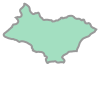

In [96]:
keephuc['geometry'][0]

In [97]:
keephuc['geometry'] = keephuc['geometry'].apply(lambda x: json.dumps(shapely.geometry.mapping(x)))

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:852: UserWarning:

Geometry column does not contain geometry.



In [99]:
keephuc['geometry'][0]

'{"type": "MultiPolygon", "coordinates": [[[[-75.69695869299994, 39.63148404300006], [-75.69652832299994, 39.631539270000076], [-75.69621979899995, 39.63151728300005], [-75.69591079299994, 39.63144761700005], [-75.69566248399997, 39.63128222700004], [-75.69543156099996, 39.63107040300008], [-75.69533638099995, 39.630880045000026], [-75.69533638399997, 39.63068969200003], [-75.69538397399998, 39.63042795200005], [-75.69528879299997, 39.63016620900004], [-75.69507464599997, 39.629833088000055], [-75.69483669499994, 39.62947616500003], [-75.69481290799996, 39.629190632000075], [-75.69464777399998, 39.62867165700004], [-75.69464634199994, 39.62866715100006], [-75.69431321599995, 39.62833402600006], [-75.69407526799995, 39.62816746500005], [-75.69393250499996, 39.627977102000045], [-75.69390871299998, 39.627810547000024], [-75.69400388499997, 39.62752500800008], [-75.69396397299994, 39.627450888000055], [-75.69383732799997, 39.62721567400007], [-75.69333764199996, 39.62697773200006], [-75.6

In [79]:
keephuc = keephuc.loc[(keephuc['LON'] > -76.866) & (keephuc['LON'] < -75.905) & (keephuc['LAT'] > 39.4965) & (keephuc['LAT'] < 40.1349), :]
keephuc['text'] = keephuc.apply(lambda row: '{} -> {}'.format(row['HUC12'], row['TOHUC']), axis = 1)
keephuc = keephuc.reset_index(drop = True)

C:\Users\isaac\Anaconda3\lib\site-packages\geopandas\geodataframe.py:853: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [82]:
# Initial Mapbox plot of all the points with data points

fig = go.Figure(go.Scattermapbox(
        lat = keephuc['LAT'],
        lon = keephuc['LON'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            opacity = 0.8
        ),
        text= keephuc['text'],
        name = 'HUCs'
    ))


layers=[{
        'name': 'Segments',
        'sourcetype': 'geojson',
        'source': json.loads(keephuc['geometry'][i]),
        'visible': True,
        'opacity': 0.5,
        'color': 'grey',
        'type': 'fill',   
        } for i in range(len(keephuc))]


fig.update_layout(
    height = 800,
    width = 1000,
    margin = {'l': 50, 'r': 50, 't': 0, 'b': 0},
    hovermode='closest',
    showlegend = True,
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        layers = layers,
        center=go.layout.mapbox.Center(
            lat=40,
            lon=-75
        ),
        pitch=0,
        zoom=7
    )
)

fig.show()

In [83]:
layers

[{'name': 'Watersheds',
  'sourcetype': 'geojson',
  'source': '{"type": "Polygon", "coordinates": [[[-78.0382648617444, 42.521527942458114], [-78.03827736180156, 42.521509442632095], [-78.03829786225467, 42.521478442070375], [-78.03835486215607, 42.52139444260677], [-78.03837486224758, 42.52136644187765], [-78.03896886155108, 42.521010441823485], [-78.03937686198009, 42.52076544211991], [-78.03956386157785, 42.52065444172717], [-78.0399038622348, 42.520451442359914], [-78.04130686272362, 42.51947944176219], [-78.04219786302639, 42.518941441889574], [-78.04232886254762, 42.518879440850924], [-78.04284286328185, 42.518640441440255], [-78.04342086359017, 42.51847244072839], [-78.04325786248522, 42.518471440939564], [-78.0429948627195, 42.518471440939564], [-78.04276886276368, 42.51847044181284], [-78.04260686238199, 42.51847044115072], [-78.04256986257205, 42.51847044115072], [-78.04210286259183, 42.51846944136185], [-78.04059386179777, 42.51846644133304], [-78.04009086183254, 42.5184664